# Step #1: The Descriptor – A 3D RGB Color Histogram

Our image descriptor is a 3D color histogram in the RGB color space with 8 bins per red, green, and blue channel.

The best way to explain a 3D histogram is to use the conjunctive AND. This image descriptor will ask a given image how many pixels have a Red value that falls into bin #1 AND a Green value that falls into bin #2 AND how many Blue pixels falls into bin #1. This process will be repeated for each combination of bins; however, it will be done in a computationally efficient manner.

When computing a 3D histogram with 8 bins, OpenCV will store the feature vector as an (8, 8, 8) array. We’ll simply flatten it and reshape it to (512,). Once it’s flattened, we can easily compare feature vectors together for similarity.

In [1]:
# import the necessary packages
import numpy as np
import cv2
import os
import pickle
import glob

%matplotlib inline  
import matplotlib
import matplotlib.pyplot as plt
 
class RGBHistogram:
	def __init__(self, bins):
		# store the number of bins the histogram will use
		self.bins = bins
 
	def describe(self, image):
		# compute a 3D histogram in the RGB colorspace,
		# then normalize the histogram so that images
		# with the same content, but either scaled larger
		# or smaller will have (roughly) the same histogram
		hist = cv2.calcHist([image], [0, 1, 2],
			None, self.bins, [0, 256, 0, 256, 0, 256])
		hist = cv2.normalize(hist, hist)
 
		# return out 3D histogram as a flattened array
		return hist.flatten()

### Images viewer

In [2]:
from io import BytesIO
import PIL
from IPython.display import display, Image

def display_img_array(ima):
    im = PIL.Image.fromarray(ima)
    bio = BytesIO()
    im.save(bio, format='png')
    display(Image(bio.getvalue(), format='png'))

### Initialize our image descriptor -- a 3D RGB histogram with
8 bins per channel

In [3]:
desc = RGBHistogram([8, 8, 8])

# Step #2: Indexing our Dataset

### Load the image, describe it using our RGB histogram descriptor, and update the index
Use glob to grab the image paths and loop over them

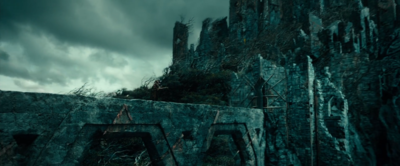

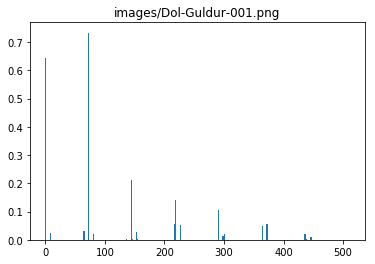

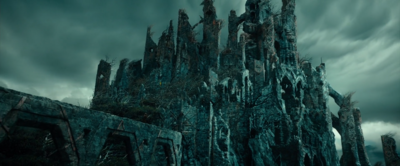

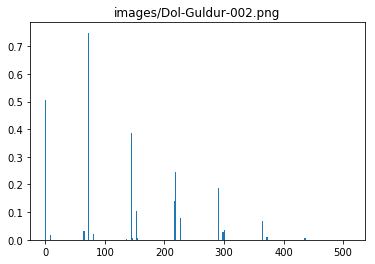

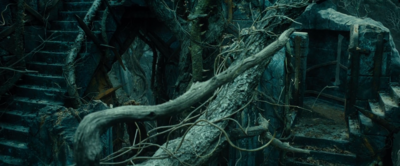

...

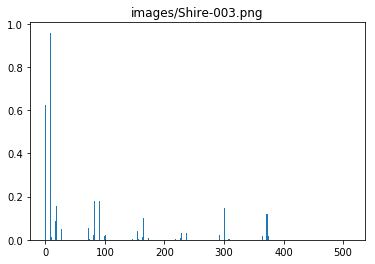

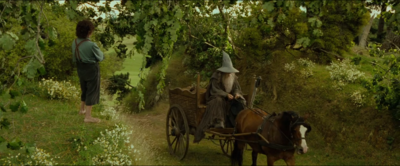

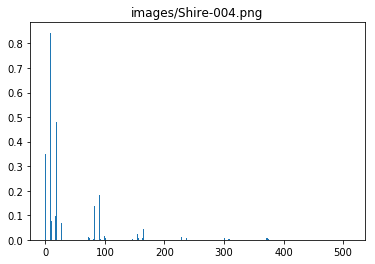

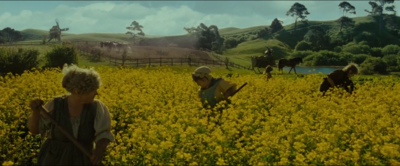

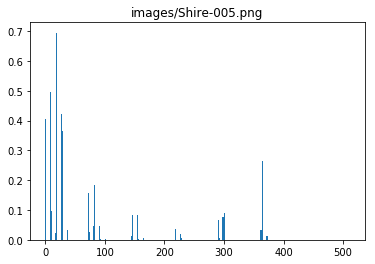

Done indexing 25 images


In [4]:
index = {}
for imagePath in glob.glob("images/*.png"):
    # extract our unique image ID (i.e. the filename)
    k = imagePath[imagePath.rfind("/") + 1:]
    image = cv2.imread(imagePath)
    features = desc.describe(image)
    index[k] = features
    display_img_array(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.hist(range(0, 512), weights=features, bins=256)
    plt.title(imagePath)
    plt.show()

print("Done indexing {} images".format(len(index.items())))

## Save to disk

In [5]:
with open('indexes/hobbits.idx', 'wb') as handle:
    pickle.dump(index, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
print("Indexes saved with size(Bytes): {}".format(os.stat('indexes/hobbits.idx').st_size))

Indexes saved with size(Bytes): 52628


# Step #3: The Search

The problem is, we need some code to perform the actual search. How are we going to compare two feature vectors and how are we going to determine how similar they are?

We use the chi-squared distance to compare our color histograms. 

Why the name chisquare distance? The chisquare test for contingency tables is based on

$\tilde{\chi}^2=\frac{1}{d}\sum_{k=1}^{n} \frac{(O_k - E_k)^2}{E_k}$

Reference:
- http://www.itl.nist.gov/div898/handbook/eda/section3/eda35f.htm
- https://stats.stackexchange.com/questions/184101/comparing-two-histograms-using-chi-square-distance

In [6]:
class Searcher:
	def __init__(self, index):
		# store our index of images
		self.index = index
 
	def search(self, queryFeatures):
		# initialize our dictionary of results
		results = {}
 
		# loop over the index
		for (k, features) in self.index.items():
			# compute the chi-squared distance between the features
			# in our index and our query features -- using the
			# chi-squared distance which is normally used in the
			# computer vision field to compare histograms
			d = self.chi2_distance(features, queryFeatures)
 
			# now that we have the distance between the two feature
			# vectors, we can udpate the results dictionary -- the
			# key is the current image ID in the index and the
			# value is the distance we just computed, representing
			# how 'similar' the image in the index is to our query
			results[k] = d
 
		# sort our results, so that the smaller distances (i.e. the
		# more relevant images are at the front of the list)
		results = sorted([(v, k) for (k, v) in results.items()])
 
		# return our results
		return results
 
	def chi2_distance(self, histA, histB, eps = 1e-10):
		# compute the chi-squared distance
		d = 0.5 * np.sum([((a - b) ** 2) / (a + b + eps)
			for (a, b) in zip(histA, histB)])
 
		# return the chi-squared distance
		return d

# Step #4: Performing a Search

Finally. We are closing in on a functioning image search engine.

query: Dol-Guldur-001.png
	1. Dol-Guldur-001.png : 0.000
	2. Dol-Guldur-002.png : 0.168
	3. Dol-Guldur-005.png : 0.213
	4. Dol-Guldur-003.png : 0.221
	5. Dol-Guldur-004.png : 0.285
	6. Goblin-001.png : 0.998
	7. Golbin-005.png : 1.118
	8. Mordor-005.png : 1.185
	9. Goblin-002.png : 1.225
	10. Mordor-003.png : 1.249
Results 1-5


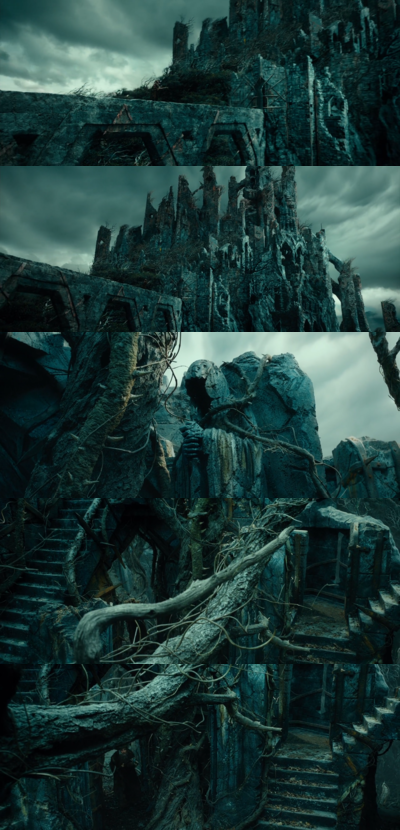

Results 6-10


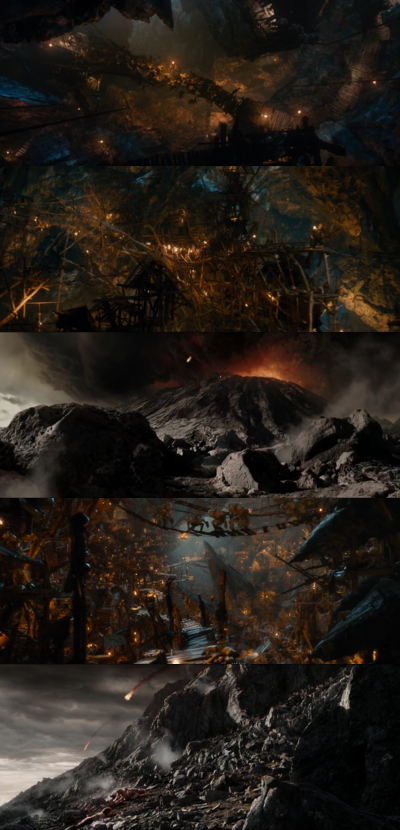

query: Dol-Guldur-002.png
	1. Dol-Guldur-002.png : 0.000
	2. Dol-Guldur-001.png : 0.168
	3. Dol-Guldur-003.png : 0.414
	4. Dol-Guldur-005.png : 0.477
	5. Dol-Guldur-004.png : 0.534
	6. Goblin-001.png : 1.283
	7. Golbin-005.png : 1.408
	8. Mordor-005.png : 1.452
	9. Goblin-002.png : 1.481
	10. Mordor-003.png : 1.513
Results 1-5


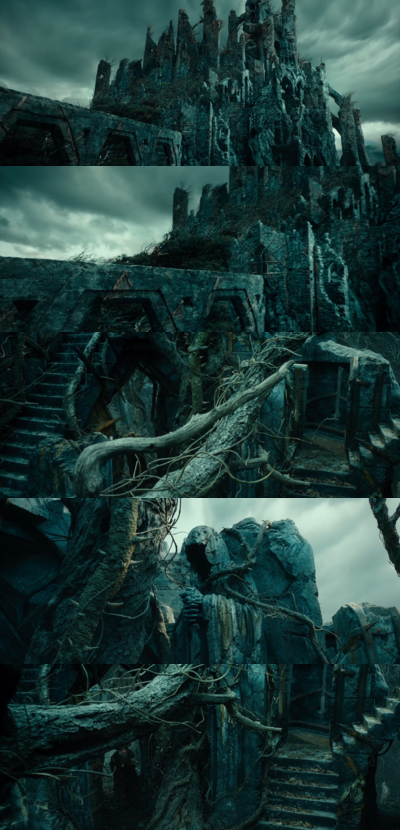

Results 6-10


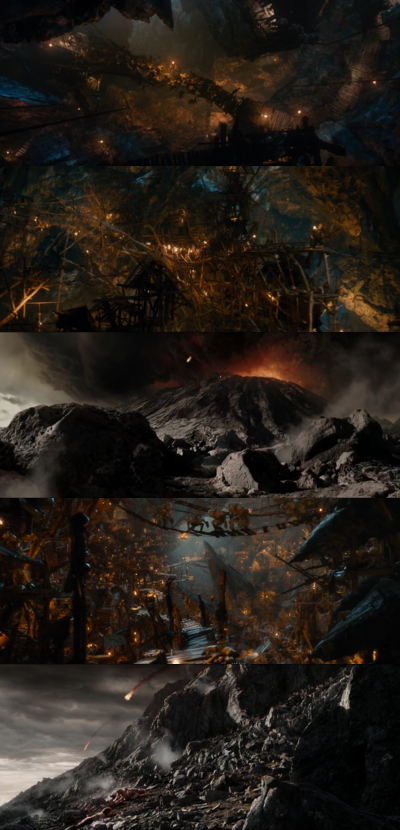

query: Dol-Guldur-003.png
	1. Dol-Guldur-003.png : 0.000
	2. Dol-Guldur-004.png : 0.042
	3. Dol-Guldur-001.png : 0.221
	4. Dol-Guldur-005.png : 0.325
	5. Dol-Guldur-002.png : 0.414
	6. Goblin-001.png : 0.647
	7. Golbin-005.png : 0.773
	8. Mordor-005.png : 0.818
	9. Goblin-002.png : 0.861
	10. Mordor-003.png : 0.886
Results 1-5


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Results 6-10


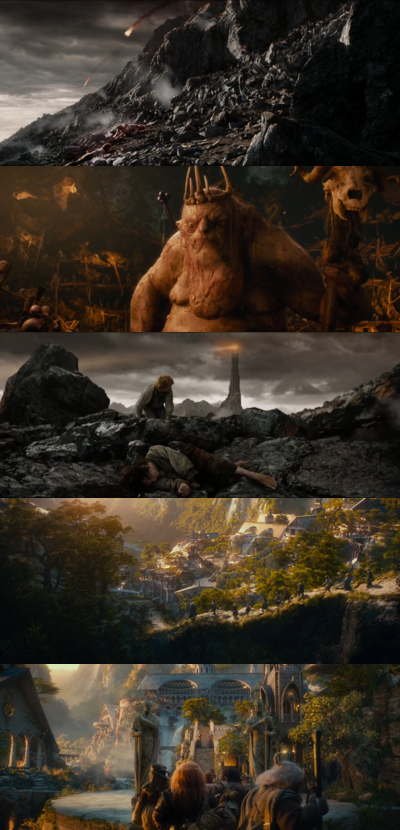

query: Goblin-003.png
	1. Goblin-003.png : 0.000
	2. Goblin-004.png : 0.103
	3. Golbin-005.png : 0.253
	4. Goblin-002.png : 0.328
	5. Goblin-001.png : 0.407
	6. Mordor-005.png : 0.599
	7. Rivendell-001.png : 0.666
	8. Mordor-003.png : 0.868
	9. Rivendell-002.png : 0.943
	10. Mordor-001.png : 0.964
Results 1-5


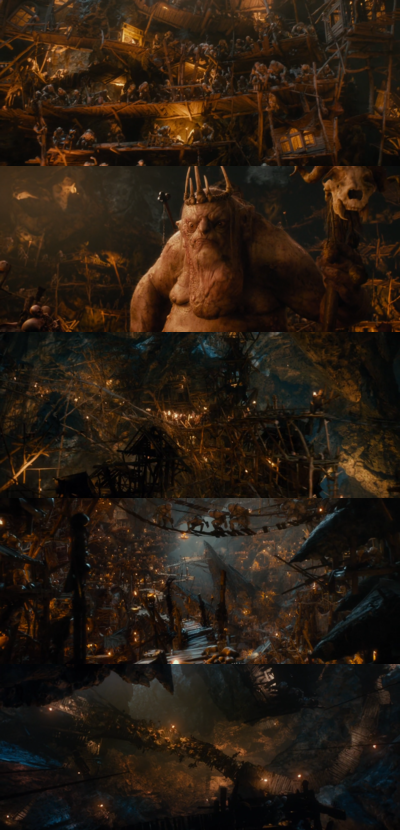

Results 6-10


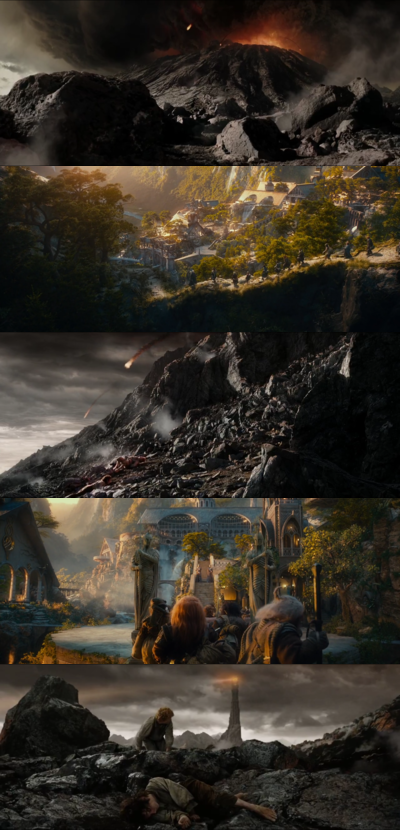

query: Goblin-004.png
	1. Goblin-004.png : 0.000
	2. Goblin-003.png : 0.103
	3. Golbin-005.png : 0.188
	4. Goblin-001.png : 0.335
	5. Goblin-002.png : 0.363
	6. Mordor-005.png : 0.594
	7. Rivendell-001.png : 0.677
	8. Mordor-003.png : 0.858
	9. Rivendell-002.png : 0.998
	10. Mordor-001.png : 0.999
Results 1-5


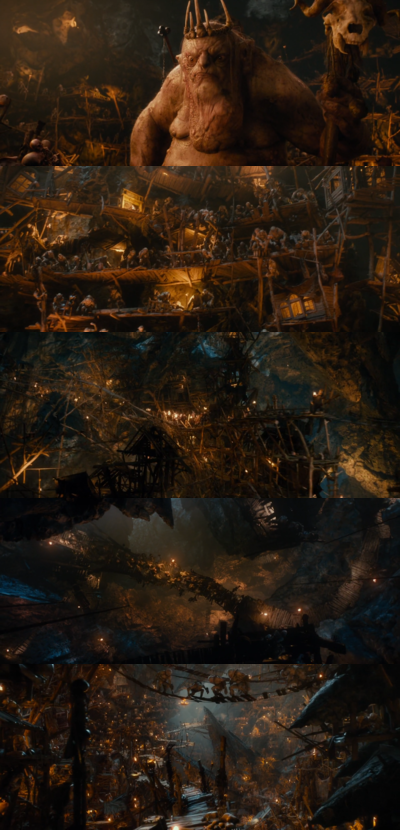

Results 6-10


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


query: Mordor-004.png
	1. Mordor-004.png : 0.000
	2. Mordor-002.png : 0.296
	3. Mordor-001.png : 0.335
	4. Mordor-003.png : 0.492
	5. Mordor-005.png : 0.652
	6. Rivendell-002.png : 0.673
	7. Rivendell-004.png : 0.706
	8. Rivendell-005.png : 0.710
	9. Goblin-002.png : 0.867
	10. Rivendell-001.png : 0.995
Results 1-5


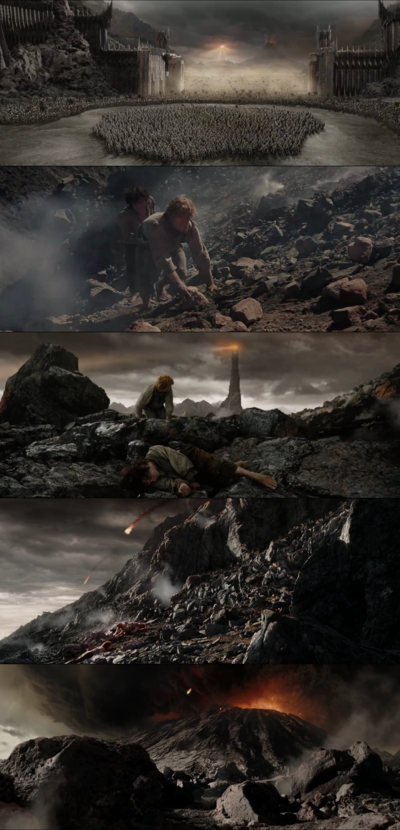

Results 6-10


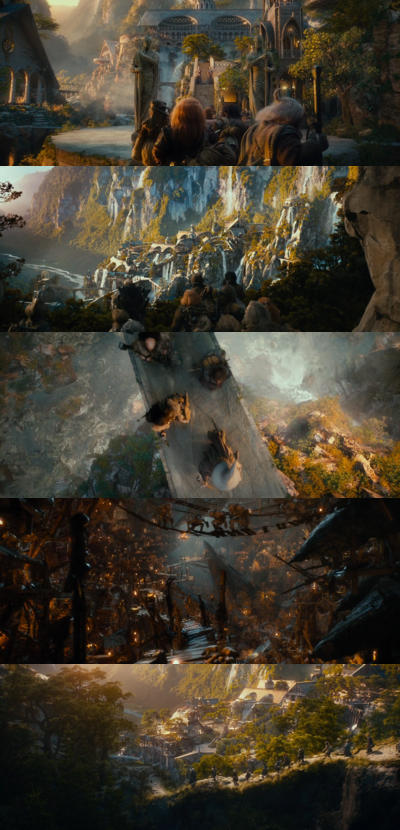

query: Mordor-005.png
	1. Mordor-005.png : 0.000
	2. Mordor-003.png : 0.110
	3. Goblin-002.png : 0.168
	4. Mordor-001.png : 0.192
	5. Goblin-001.png : 0.222
	6. Golbin-005.png : 0.321
	7. Rivendell-001.png : 0.410
	8. Goblin-004.png : 0.594
	9. Goblin-003.png : 0.599
	10. Rivendell-002.png : 0.642
Results 1-5


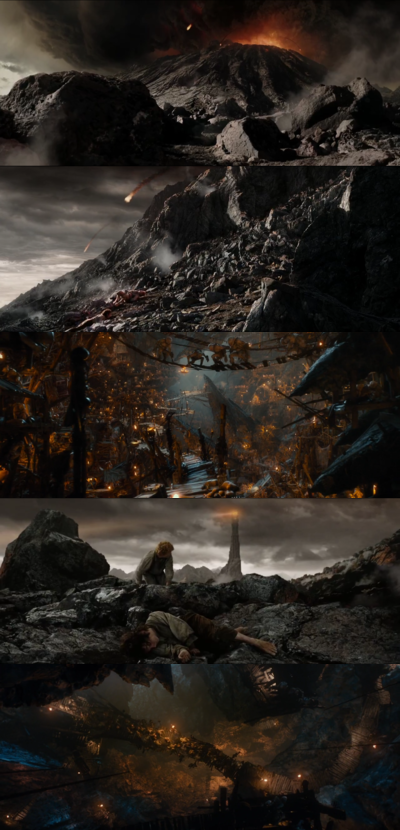

Results 6-10


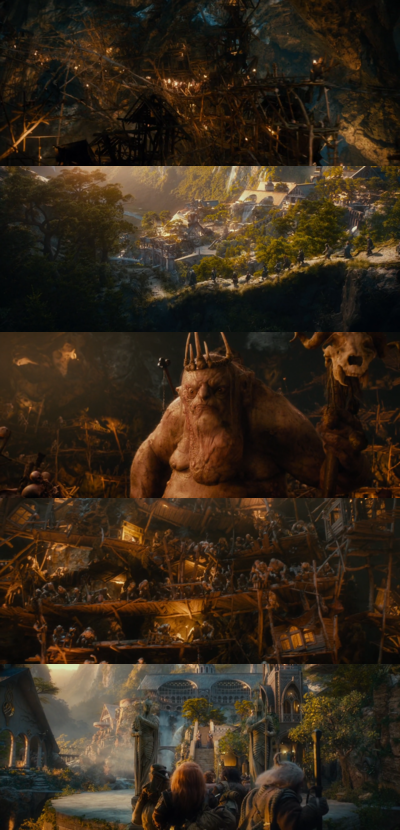

query: Rivendell-001.png
	1. Rivendell-001.png : 0.000
	2. Rivendell-002.png : 0.383
	3. Mordor-005.png : 0.410
	4. Goblin-002.png : 0.417
	5. Goblin-001.png : 0.463
	6. Golbin-005.png : 0.476
	7. Mordor-001.png : 0.533
	8. Mordor-003.png : 0.549
	9. Rivendell-004.png : 0.580
	10. Goblin-003.png : 0.666
Results 1-5


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Results 6-10


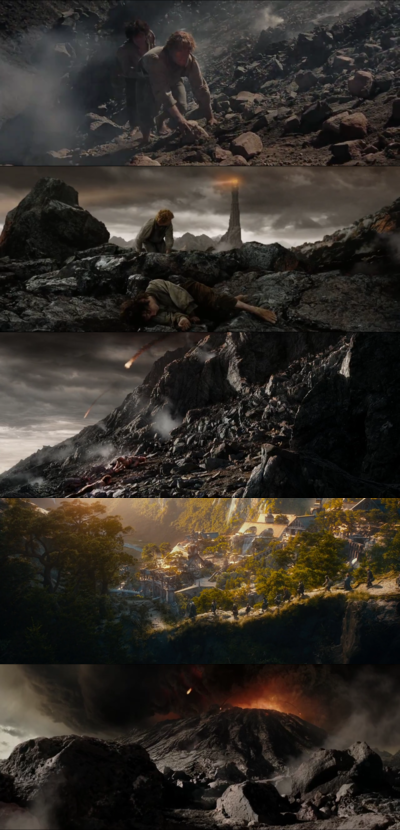

query: Shire-001.png
	1. Shire-001.png : 0.000
	2. Shire-004.png : 0.696
	3. Shire-003.png : 0.727
	4. Shire-002.png : 0.755
	5. Shire-005.png : 1.235
	6. Rivendell-001.png : 1.314
	7. Golbin-005.png : 1.413
	8. Rivendell-002.png : 1.416
	9. Goblin-001.png : 1.446
	10. Goblin-002.png : 1.453
Results 1-5


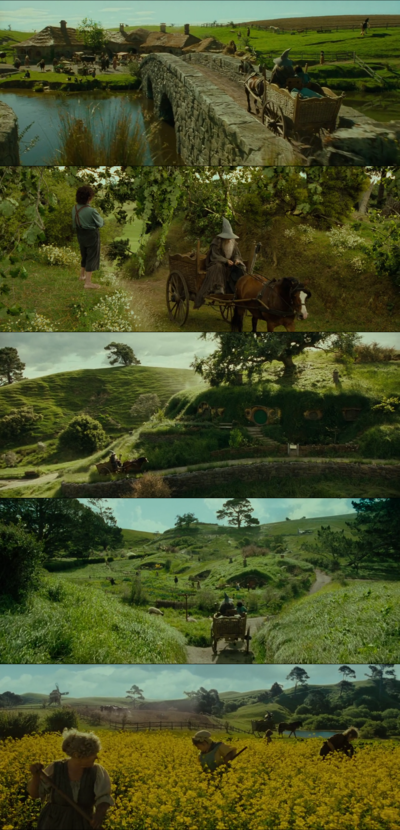

Results 6-10


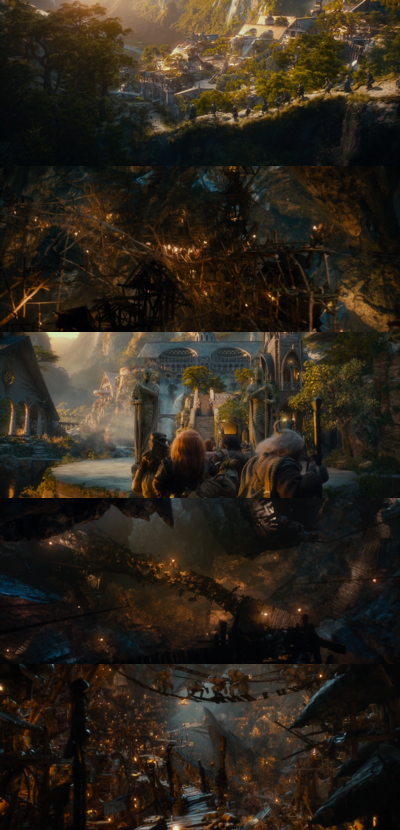

query: Shire-002.png
	1. Shire-002.png : 0.000
	2. Shire-001.png : 0.755
	3. Shire-003.png : 0.882
	4. Shire-004.png : 1.179
	5. Shire-005.png : 1.674
	6. Goblin-001.png : 1.750
	7. Mordor-005.png : 1.777
	8. Golbin-005.png : 1.785
	9. Rivendell-001.png : 1.802
	10. Mordor-001.png : 1.831
Results 1-5


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Results 6-10


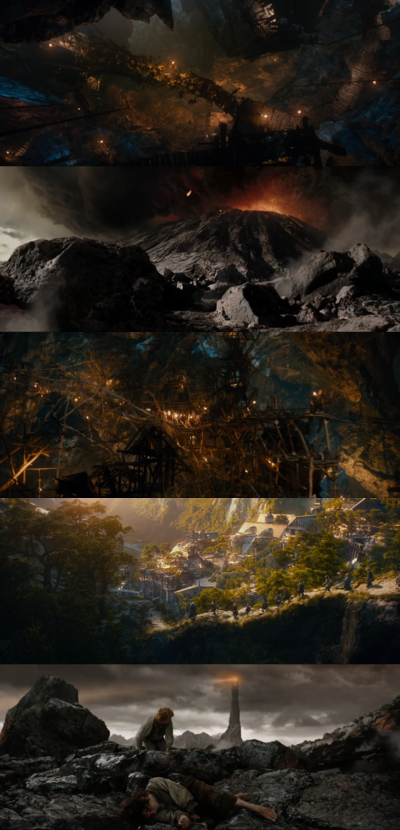

query: Shire-003.png
	1. Shire-003.png : 0.000
	2. Shire-004.png : 0.575
	3. Shire-001.png : 0.727
	4. Shire-002.png : 0.882
	5. Goblin-001.png : 1.089
	6. Golbin-005.png : 1.099
	7. Rivendell-001.png : 1.114
	8. Mordor-005.png : 1.151
	9. Mordor-001.png : 1.190
	10. Goblin-002.png : 1.211
Results 1-5


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [7]:
searcher = Searcher(index)

# loop over images in the index -- we will use each one as
# a query image
for (query, queryFeatures) in index.items():
    # perform the search using the current query
    results = searcher.search(queryFeatures)

    # load the query image and display it
    path = "images/%s" % (query)
    queryImage = cv2.imread(path)
    plt.imshow(cv2.cvtColor(queryImage, cv2.COLOR_BGR2RGB))
    print("query: {}".format(query))

    # initialize the two montages to display our results --
    # we have a total of 25 images in the index, but let's only
    # display the top 10 results; 5 images per montage, with
    # images that are 400x166 pixels
    montageA = np.zeros((166 * 5, 400, 3), dtype = "uint8")
    montageB = np.zeros((166 * 5, 400, 3), dtype = "uint8")

    # loop over the top ten results
    for j in range(0, 10):
    # grab the result (we are using row-major order) and
        # load the result image
        (score, imageName) = results[j]
        path = "images/%s" % (imageName)
        result = cv2.imread(path)
        print("\t{:d}. {:s} : {:.3f}".format(j + 1, imageName, score))

        # check to see if the first montage should be used
        if j < 5:
            montageA[j * 166:(j + 1) * 166, :] = result

        # otherwise, the second montage should be used
        else:
            montageB[(j - 5) * 166:((j - 5) + 1) * 166, :] = result

    # show the results
    print("Results 1-5")
    display_img_array(cv2.cvtColor(montageA, cv2.COLOR_BGR2RGB))
    print("Results 6-10")
    display_img_array(cv2.cvtColor(montageB, cv2.COLOR_BGR2RGB))

# External tests

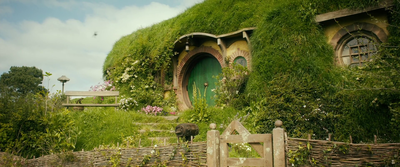

query: queries/shire-query.png
	1. Shire-004.png : 1.077
	2. Shire-003.png : 1.114
	3. Shire-001.png : 1.278
	4. Shire-002.png : 1.376
	5. Shire-005.png : 1.779
	6. Rivendell-001.png : 1.822
	7. Rivendell-004.png : 2.077
	8. Rivendell-002.png : 2.146
	9. Golbin-005.png : 2.170
	10. Goblin-001.png : 2.198
Results 1-5


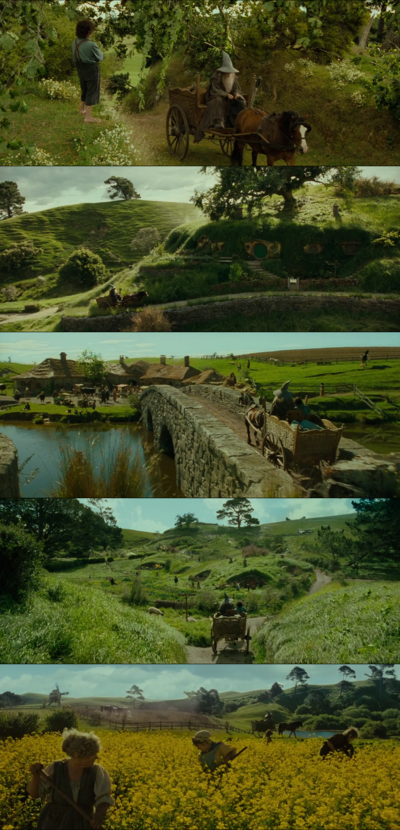

Results 6-10


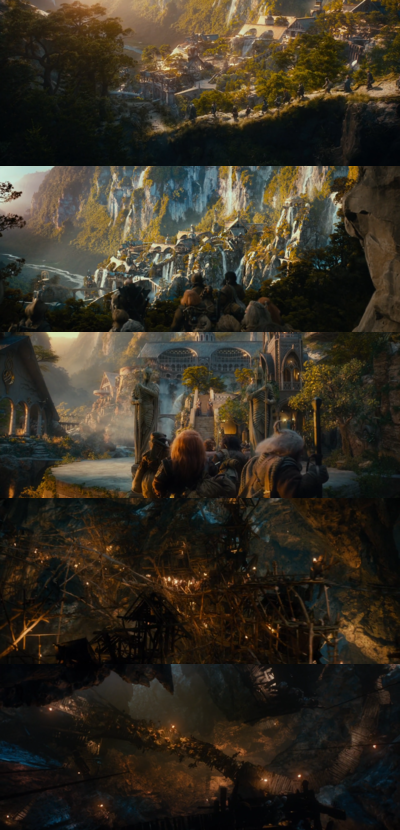

In [9]:
queryImage = cv2.imread("queries/shire-query.png")
display_img_array(cv2.cvtColor(queryImage, cv2.COLOR_BGR2RGB))
print("query: {}".format("queries/shire-query.png"))
 
desc = RGBHistogram([8, 8, 8])
queryFeatures = desc.describe(queryImage)
 
searcher = Searcher(index)
results = searcher.search(queryFeatures)
 
# initialize the two montages to display our results --
# we have a total of 25 images in the index, but let's only
# display the top 10 results; 5 images per montage, with
# images that are 400x166 pixels
montageA = np.zeros((166 * 5, 400, 3), dtype = "uint8")
montageB = np.zeros((166 * 5, 400, 3), dtype = "uint8")
 
# loop over the top ten results
for j in range(0, 10):
    # grab the result (we are using row-major order) and
    # load the result image
    (score, imageName) = results[j]
    path = "images/%s" % (imageName)
    result = cv2.imread(path)
    print("\t{:d}. {:s} : {:.3f}".format(j + 1, imageName, score))

    # check to see if the first montage should be used
    if j < 5:
        montageA[j * 166:(j + 1) * 166, :] = result

    # otherwise, the second montage should be used
    else:
        montageB[(j - 5) * 166:((j - 5) + 1) * 166, :] = result

print("Results 1-5")
display_img_array(cv2.cvtColor(montageA, cv2.COLOR_BGR2RGB))
print("Results 6-10")
display_img_array(cv2.cvtColor(montageB, cv2.COLOR_BGR2RGB))